# End to End Multiclass Dog Breed Classification

## Problem Definition
Imagine going out or hanging out with your friends. You see a dog and want to know what breed the dog is. This model will be able to acquire an image of said dog, process that image and produce its breed as output. The end goal of this project is to project a system that can allow an individual to take a picture of a dog and obtain it's breed almost instantaneously.

## Data
The data used in this project was obtained from kaggle: https://www.kaggle.com/competitions/dog-breed-identification/data. Some information about the data:
1. The data used are in form of images (unstructured data) so deep learning/transfer learning is preferrable
2. The data contains 120 breeds of dogs (120 different classes)
3. There are 10,000+ images in the train data set (They have labels)
4. There are 10,000+ images in the test data set (They are no labels because we are trying to predict them)

## 3.Evaluation
The mode of evaluation is `Multi Class Log Loss` between predicted probability and observed target. The format of submission is contained here: https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

### Getting workspace ready
* Import necessary libraries
* Check for GPU

In [ ]:
# Importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import categorical_crossentropy
import tensorflow_hub as hub
print(tf.__version__, ",",hub.__version__)

# Check for GPU
print("GPU is", "available" if tf.config.list_physical_devices("GPU") else "NOT AVAILABLE")

2.15.0 , 0.16.1
GPU is NOT AVAILABLE


In [ ]:
# Installing required version of tensorflow and tensorhub
!pip install tensorflow==2.15.0 tensorflow-hub keras==2.15.0

In [ ]:
# Checking versions again
print(tf.__version__, ",",hub.__version__)

2.15.0 , 0.16.1


## Getting data ready (Converting images into tensors)
In any machine learning model, data must always be in numerical form. This is the first step(numerical representation)

In [ ]:
# Loading the labels
labels_csv = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/DogVison/dog-breed-identification/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126


In [ ]:
labels_csv["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
komondor,67
brabancon_griffon,67


In [ ]:
labels_csv["breed"].value_counts().median()

82.0

<Axes: xlabel='breed'>

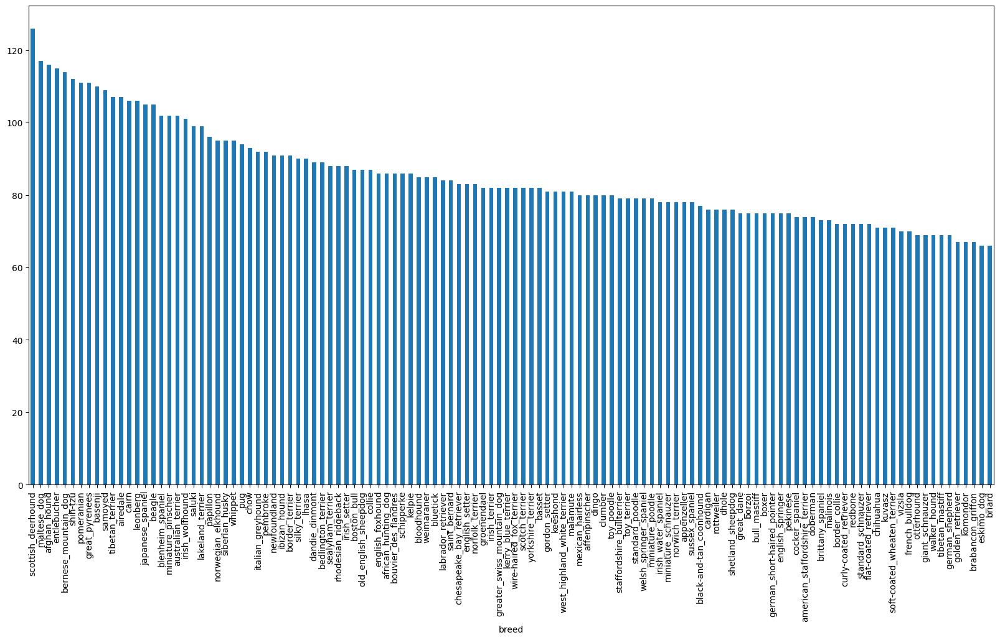

In [ ]:
# Checking range of breed content
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

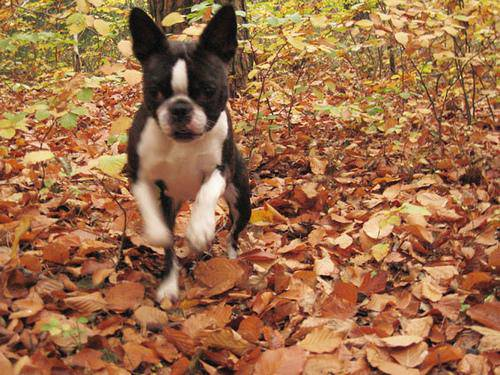

In [ ]:
from IPython.display import Image
Image("/content/drive/MyDrive/Colab Notebooks/DogVison/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

We will put the filenames in a proper format

In [ ]:
filenames = ["/content/drive/MyDrive/Colab Notebooks/DogVison/dog-breed-identification/train/" +filename+ ".jpg" for filename in labels_csv["id"]]
len(filenames)

10222

In [ ]:
# Comparing the number of labels and features
import os
if (len(os.listdir("/content/drive/MyDrive/Colab Notebooks/DogVison/dog-breed-identification/train")) == len(filenames)):
  print("Number of labels and features are equal")
else:
  print("Number of labels and feautures are not equal")

Number of labels and features are equal


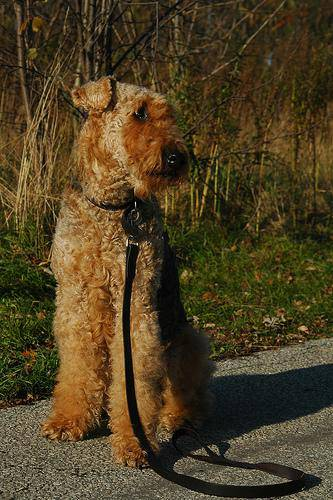

In [ ]:
Image(filenames[5000])

In [ ]:
# Getting labels
labels = labels_csv["breed"]
labels.count()

10222

In [ ]:
# Getting unique breeds
Unique_breeds = labels.unique()
Unique_breeds

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'borzoi', 'basenji', 'scottish_deerhound',
       'shetland_sheepdog', 'walker_hound', 'maltese_dog',
       'norfolk_terrier', 'african_hunting_dog',
       'wire-haired_fox_terrier', 'redbone', 'lakeland_terrier', 'boxer',
       'doberman', 'otterhound', 'standard_schnauzer',
       'irish_water_spaniel', 'black-and-tan_coonhound', 'cairn',
       'affenpinscher', 'labrador_retriever', 'ibizan_hound',
       'english_setter', 'weimaraner', 'giant_schnauzer', 'groenendael',
       'dhole', 'toy_poodle', 'border_terrier', 'tibetan_terrier',
       'norwegian_elkhound', 'shih-tzu', 'irish_terrier', 'kuvasz',
       'german_shepherd', 'greater_swiss_mountain_dog', 'basset',
       'australian_terrier', 'schipperke', 'rhodesian_ridgeback',
       'irish_setter', 'appenzeller', 'bloodhound', 'samoyed',
       'miniature_schnauzer', 'brittany_spaniel', 'kelpie', 'papillon',
       'borde

In [ ]:
len(Unique_breeds)

120

In [ ]:
boolean_values = [labels == Unique_breeds for labels in labels]
boolean_values[13]

array([False, False, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
len(boolean_values)

10222

### Splitting into training and validation set

In [ ]:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
from sklearn.model_selection import train_test_split

X = filenames
y = boolean_values

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

In [ ]:
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

### Data Preprocessing( Converting images to tensors)

In [ ]:
IMG_SIZE = 128

def image_process(image_path, img_size = IMG_SIZE):
  """
  Function for converting images to tensors
  """

  # reading image as input
  img = tf.io.read_file(image_path)

  # turning variable into tensors
  img = tf.image.decode_jpeg(img , channels=3)

  # Normalization(Switch range from 0-255 to 0-1)
  img = tf.image.convert_image_dtype(img, tf.float32)

  # Resizing image
  img = tf.image.resize(img, size = [IMG_SIZE, IMG_SIZE])

  return img

In [ ]:
# Create a fuction for grouping image and label

def image_label(image, label):
  image = image_process(image)
  return(image, label)

In [ ]:
# Create function for splitting data into batches

BATCH_SIZE = 32

def data_batch(X, y=None, batch_size= BATCH_SIZE, valid_data=False, test_data=False):
  """
  Function for creating training, testing adn validation batches
  """

  # Testing batches
  if test_data:
    print("Test Data Batches loading....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(image_process).batch(BATCH_SIZE)
    return data_batch

  elif valid_data:
    print("Validation Data Batches loading....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Training Data Batches Loading....")
    data= tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data = data.shuffle(buffer_size = len(X))
    data_batch = data.map(image_label).batch(BATCH_SIZE)
    return data_batch

In [ ]:
train_data = data_batch(X_train, y_train)
val_data = data_batch(X_val, y_val, valid_data=True)

Training Data Batches Loading....
Validation Data Batches loading....


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualization

In [ ]:
### Function for data visualization
def vis_25_images(image, labels):
  """
  Function for visualizing 25 images
  """
  plt.figure(figsize=(10,10))

  for i in range(25):
    ax= plt.subplot(5, 5, i+1)
    plt.imshow(image[i])
    plt.title(Unique_breeds[labels[i].argmax()])
    plt.axis("off")

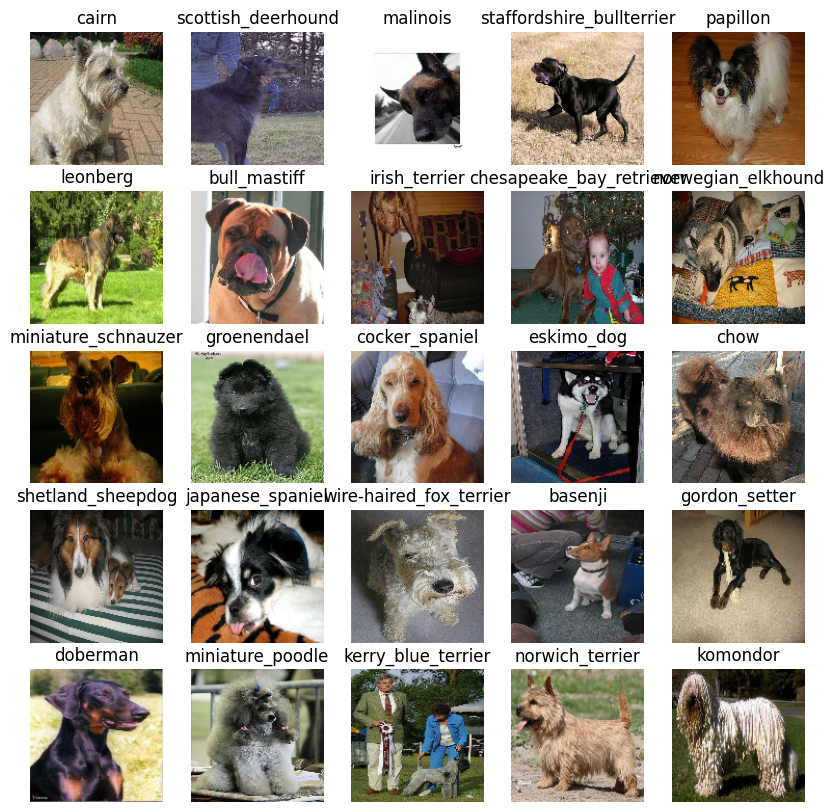

In [ ]:
# @title
train_images, train_labels = next(train_data.as_numpy_iterator())
vis_25_images(train_images, train_labels)

## Modelling

In [ ]:
input_shape = (None, IMG_SIZE, IMG_SIZE, 3)
output_shape = len(Unique_breeds) # Corrected output shape to be the number of unique breeds
model_url = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2"

We will making use of the keras framework in building our model.

In [ ]:
def create_model(model_url = model_url, input_shape = input_shape, output_shape = output_shape):
    print("Loading MobileVNet model from" + model_url)

    # Setup the model
    model = tf.keras.Sequential([
        hub.KerasLayer(model_url), # Layer 1
        tf.keras.layers.Dense(units=output_shape, activation="softmax") # Layer 2
    ])

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    # Build the model
    model.build(input_shape)

    return model

In [ ]:
model = create_model()
model.summary()

Loading MobileVNet model fromhttps://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              1692489   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 1812729 (6.92 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 1692489 (6.46 MB)
_________________________________________________________________


## Creating Callbacks

In [ ]:
%load_ext tensorboard

In [ ]:
# Tensorboard callback
import datetime

def tensorboard_callback():
  log_dir = os.path.join("/content/drive/MyDrive/Colab Notebooks/DogVison/logs",
                         datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(log_dir)

In [ ]:
# Early Stopping Callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy", patience = 3)

## Training the Model

In [ ]:
NUM_EPOCHS = 100 #@ params {type: "slider", min: 0, max: 100, step: 10}

In [ ]:
# Creating a function for training the model
def train_model():
  """
  Function for training the model and returning a trained model
  """

  # Creating a model
  model = create_model()

  # Creating tensorboard session
  tensorboard = tensorboard_callback()

  # Fitting the model
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])

  # returning model
  return model

In [ ]:
model = train_model()

Loading MobileVNet model fromhttps://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2
Epoch 1/100
25/25 [==============================] - 256s 10s/step - loss: 5.5547 - accuracy: 0.0487 - val_loss: 4.7389 - val_accuracy: 0.0650
Epoch 2/100
25/25 [==============================] - 6s 227ms/step - loss: 2.3063 - accuracy: 0.4412 - val_loss: 3.7927 - val_accuracy: 0.1650
Epoch 3/100
25/25 [==============================] - 8s 332ms/step - loss: 1.0405 - accuracy: 0.7875 - val_loss: 3.5915 - val_accuracy: 0.2000
Epoch 4/100
25/25 [==============================] - 6s 230ms/step - loss: 0.4912 - accuracy: 0.9525 - val_loss: 3.5798 - val_accuracy: 0.1900
Epoch 5/100
25/25 [==============================] - 8s 336ms/step - loss: 0.2656 - accuracy: 0.9937 - val_loss: 3.6040 - val_accuracy: 0.1950
Epoch 6/100
25/25 [==============================] - 6s 234ms/step - loss: 0.1637 - accuracy: 1.0000 - val_loss: 3.6067 - val_accuracy: 0.2000


## Checking TensorBoard logs

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making predictions using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 2s 145ms/step


array([[2.2187571e-05, 1.7885299e-05, 6.5132137e-04, ..., 3.0255605e-05,
        1.3320888e-03, 4.8312254e-04],
       [3.0426198e-04, 4.1404795e-02, 1.5642822e-06, ..., 4.6929677e-07,
        4.5440215e-06, 1.9497184e-06],
       [4.0908759e-03, 1.5007118e-04, 2.0566627e-03, ..., 6.1110070e-04,
        4.3739565e-05, 5.3525732e-06],
       ...,
       [8.1724077e-03, 8.4103784e-05, 1.6702332e-05, ..., 4.1044634e-05,
        3.5326733e-04, 2.4891971e-04],
       [9.9515937e-06, 1.9904677e-05, 1.3738728e-01, ..., 6.7539149e-05,
        8.2551787e-04, 8.8911598e-05],
       [1.1462462e-03, 3.2892411e-05, 3.5742018e-05, ..., 8.1120932e-04,
        1.0512866e-05, 6.4814481e-04]], dtype=float32)

In [ ]:
predictions[0]

array([2.21875707e-05, 1.78852988e-05, 6.51321374e-04, 1.58586263e-04,
       7.09726126e-04, 3.88310244e-03, 9.32446402e-03, 1.34251904e-05,
       2.65109818e-03, 9.17825491e-06, 4.82712901e-04, 1.20304665e-02,
       3.41286534e-03, 9.52369592e-05, 2.16535851e-02, 1.74771340e-05,
       2.29068100e-02, 8.99806764e-05, 9.93231195e-04, 3.53129506e-02,
       1.53756123e-02, 2.03648885e-03, 1.08108634e-05, 7.96570908e-03,
       1.32506248e-03, 9.60610632e-04, 1.57472150e-05, 1.17679246e-01,
       1.44221165e-04, 1.31288695e-03, 3.80246383e-05, 8.15815365e-05,
       3.02708615e-03, 5.45609219e-04, 7.76515668e-03, 2.06516552e-06,
       2.07945053e-02, 7.53562618e-03, 6.92110090e-03, 1.91597082e-05,
       2.11602164e-04, 4.16312287e-05, 3.94387590e-03, 1.51293330e-06,
       1.83016411e-04, 1.54390070e-03, 7.74333312e-05, 2.08000172e-04,
       1.53430490e-04, 5.75432135e-03, 7.36379616e-06, 4.08661494e-04,
       8.92651497e-06, 1.44742415e-04, 1.68659626e-05, 7.98706533e-05,
      

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {Unique_breeds[np.argmax(predictions[index])]}")

[1.1677074e-03 6.2228800e-03 4.2327589e-05 6.3927507e-01 9.5400022e-04
 4.9009564e-06 7.2092487e-04 2.3035673e-02 4.9348728e-04 3.2725275e-04
 1.1334810e-01 2.5501653e-05 3.8582675e-06 1.1879480e-03 3.1745373e-03
 6.5906229e-04 2.2345066e-02 1.3782639e-03 2.8272439e-04 1.7395627e-03
 9.0626512e-05 7.3215907e-04 1.0064754e-03 7.4850486e-06 1.3795571e-06
 3.3622753e-04 8.5035926e-03 1.5336552e-04 4.9923028e-06 2.4036362e-05
 2.9099760e-05 5.4256329e-03 9.9836197e-06 1.0734120e-04 5.4182822e-04
 5.8394443e-04 4.6606747e-06 3.2894145e-04 4.8465547e-05 3.8385193e-03
 1.2120733e-03 6.2668556e-03 1.6505155e-04 9.1867341e-06 1.7433602e-04
 5.5550074e-05 6.1985425e-05 3.2909052e-03 3.6430019e-06 2.5785581e-05
 5.4676324e-02 3.8902867e-06 1.5673782e-04 1.4774378e-05 3.5337703e-03
 3.2975292e-03 1.8172745e-03 1.4552799e-02 3.9378224e-06 2.9038930e-02
 4.2480002e-05 5.1871530e-04 7.6157003e-06 5.0117585e-05 8.9811205e-05
 2.2215821e-05 1.1233737e-04 6.9463757e-05 5.8936595e-05 1.3446676e-06
 3.068

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return Unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'african_hunting_dog'

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(Unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.25828475, 0.36198825, 0.24389817],
         [0.39360544, 0.3418826 , 0.30183154],
         [0.8296768 , 0.7504122 , 0.74760556],
         ...,
         [0.8228947 , 0.8611053 , 0.8719636 ],
         [0.76902866, 0.8160875 , 0.8079686 ],
         [0.8183106 , 0.82737565, 0.84341663]],
 
        [[0.30484715, 0.29425842, 0.2039199 ],
         [0.4352226 , 0.37971696, 0.31883615],
         [0.8593526 , 0.80739874, 0.77293175],
         ...,
         [0.85530514, 0.89059925, 0.917223  ],
         [0.80846506, 0.8516023 , 0.8737746 ],
         [0.7754192 , 0.8053707 , 0.84239584]],
 
        [[0.75496686, 0.6921665 , 0.66526437],
         [0.807427  , 0.804948  , 0.7710658 ],
         [0.9814564 , 0.9935267 , 0.971697  ],
         ...,
         [0.91192657, 0.94484705, 0.9793709 ],
         [0.8952671 , 0.9312506 , 0.98800606],
         [0.8093318 , 0.85525966, 0.91700304]],
 
        ...,
 
        [[0.45503026, 0.4585416 , 0.41656855],
         [0.5492001 , 0.5392863 , 0.49725

We'll create a function which:

Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
Convert the prediction probabilities to a predicted label.
Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

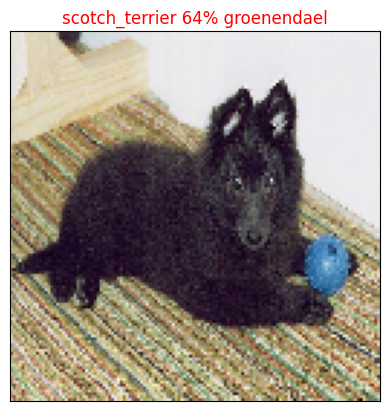

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

This function will:

Take an input of prediction probabilities array and a ground truth array and an integer,
Find the prediction using get_pred_label() and
Find the top 10:

- Prediction probabilities indexes
- Prediction probabilities values
- Prediction labels
- Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = Unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

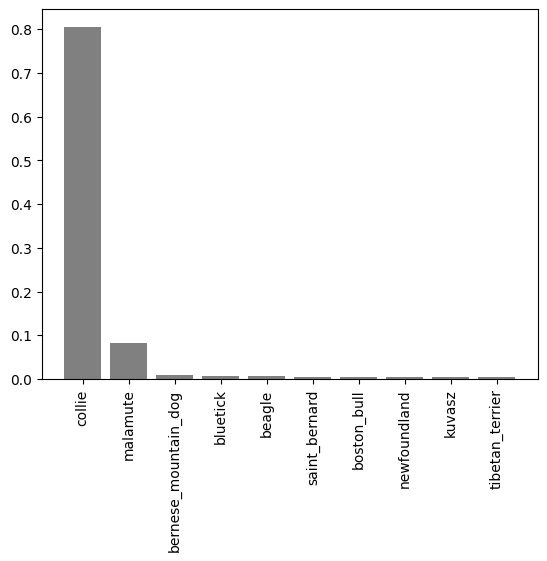

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Function to help us visualize our predictions and evaluate our model

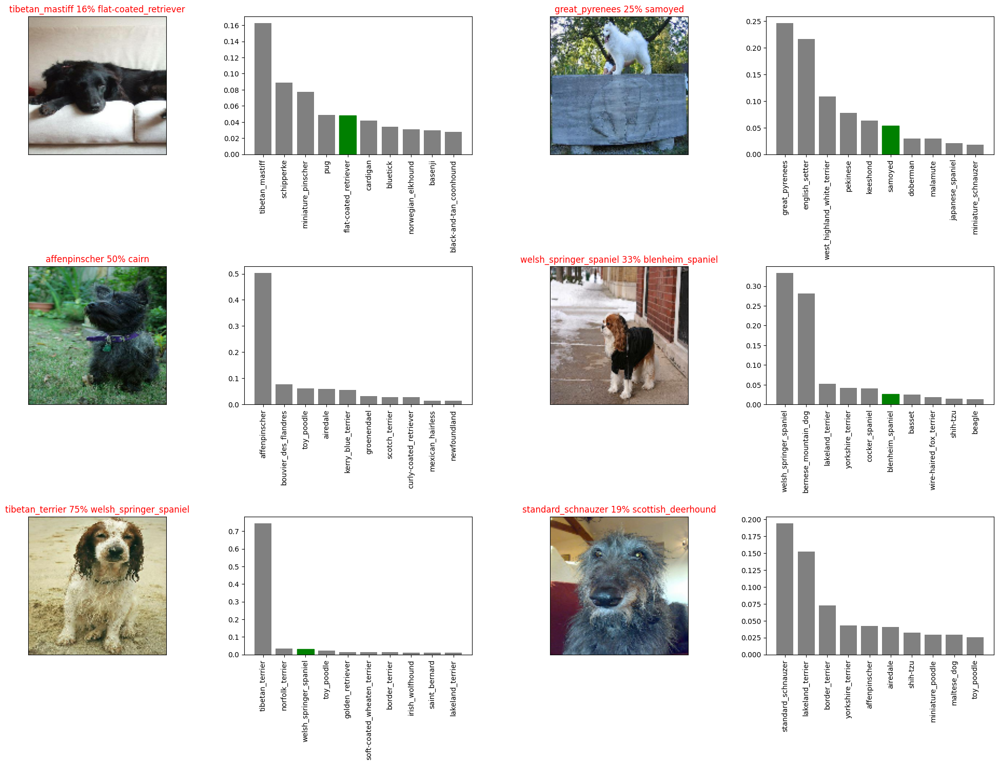

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

# Saving and Reloading a model

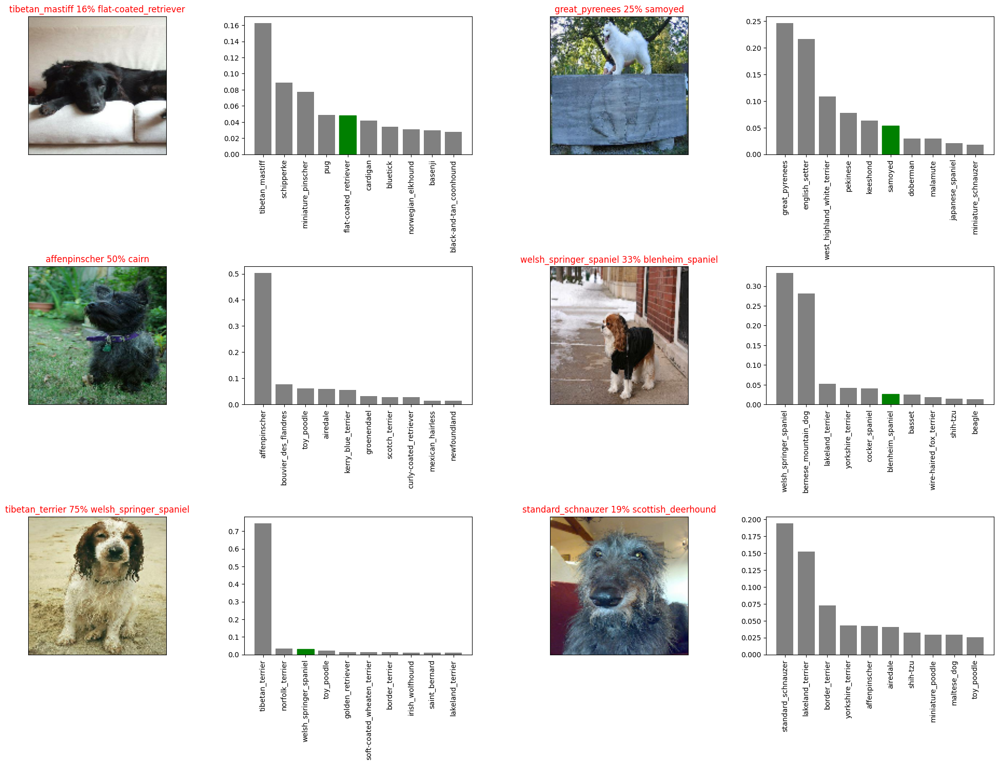

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
# Create a function to save and load a trained model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Colab Notebooks/DogVison/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Colab Notebooks/DogVison/models/20250806-18191754504347-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Colab Notebooks/DogVison/models/20250806-18191754504347-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("/content/drive/MyDrive/Colab Notebooks/DogVison/models/20250806-16541754499299-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Colab Notebooks/DogVison/models/20250806-16541754499299-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 147ms/step - loss: 3.6067 - accuracy: 0.2000


[3.6067113876342773, 0.20000000298023224]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 150ms/step - loss: 3.5138 - accuracy: 0.2450


[3.5137603282928467, 0.24500000476837158]

# Training Model on Full Data

In [ ]:
# Create a data batch with the full data set
full_data = data_batch(X, y)

Training Data Batches Loading....


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Loading MobileVNet model fromhttps://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2


In [ ]:
# Create full model callbacks
full_model_tensorboard = tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 73s 210ms/step - loss: 2.8813 - accuracy: 0.3300
Epoch 2/100
320/320 [==============================] - 71s 220ms/step - loss: 1.6294 - accuracy: 0.5598
Epoch 3/100
320/320 [==============================] - 66s 206ms/step - loss: 1.2727 - accuracy: 0.6384
Epoch 4/100
320/320 [==============================] - 68s 213ms/step - loss: 1.0284 - accuracy: 0.7024
Epoch 5/100
320/320 [==============================] - 69s 215ms/step - loss: 0.8503 - accuracy: 0.7509
Epoch 6/100
320/320 [==============================] - 69s 216ms/step - loss: 0.7064 - accuracy: 0.7915
Epoch 7/100
320/320 [==============================] - 67s 209ms/step - loss: 0.5937 - accuracy: 0.8311
Epoch 8/100
320/320 [==============================] - 75s 234ms/step - loss: 0.5047 - accuracy: 0.8575
Epoch 9/100
320/320 [==============================] - 70s 217ms/step - loss: 0.4177 - accuracy: 0.8896
Epoch 10/100
320/320 [==============================] - 66s 205m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Colab Notebooks/DogVison/models/20250806-18511754506274-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Colab Notebooks/DogVison/models/20250806-18511754506274-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model('/content/drive/MyDrive/Colab Notebooks/DogVison/models/20250806-18511754506274-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Colab Notebooks/DogVison/models/20250806-18511754506274-full-image-set-mobilenetv2-Adam.h5


# Making predictions on the test dataset

In [73]:
# Load test image filenames
test_path = "/content/drive/MyDrive/Colab Notebooks/DogVison/dog-breed-identification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/DogVison/dog-breed-identification/test/e062ea256ada165dfe998fbc6529dff7.jpg',
 '/content/drive/MyDrive/Colab Notebooks/DogVison/dog-breed-identification/test/eab189c5274b79b36dd566fea4e9847e.jpg',
 '/content/drive/MyDrive/Colab Notebooks/DogVison/dog-breed-identification/test/ed0690862339bb098b08da7ed8b4eac2.jpg',
 '/content/drive/MyDrive/Colab Notebooks/DogVison/dog-breed-identification/test/f4ec1eb228bb0a7084de552fa4333b43.jpg',
 '/content/drive/MyDrive/Colab Notebooks/DogVison/dog-breed-identification/test/ec89476b99aab390011acee436f9642a.jpg',
 '/content/drive/MyDrive/Colab Notebooks/DogVison/dog-breed-identification/test/efd7266343c00fd2cb3cf5aec4aa0b42.jpg',
 '/content/drive/MyDrive/Colab Notebooks/DogVison/dog-breed-identification/test/ea1e945b924638c2059d7718b522d48f.jpg',
 '/content/drive/MyDrive/Colab Notebooks/DogVison/dog-breed-identification/test/ef5c93599bcc330fd9642266d9650309.jpg',
 '/content/drive/MyDrive/Colab Notebooks/DogViso

In [74]:
len(test_filenames)

10367

In [75]:
# Create test data batch
test_data = data_batch(test_filenames, test_data=True)

Test Data Batches loading....


In [76]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None)>

In [77]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 365s 1s/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=",")